<a href="https://colab.research.google.com/github/Olaniru/human-fetal-pancreas/blob/main/15PCW_visualisation_spatial_trajectory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import module
import stlearn as st 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
st.settings.set_figure_params(dpi=180)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
#specify path to 15PCW pancreas 10x Visium data
# specify PATH to data
BASE_PATH = Path("/content/drive/MyDrive/spatial/15a/")

# spot tile is the intermediate result of image pre-processing
TILE_PATH = Path("/tmp/tiles")
TILE_PATH.mkdir(parents=True, exist_ok=True)

# output path
OUT_PATH = Path("content/drive/MyDrive/spatial/results/")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [ ]:
#load 15PCW pancreas spatial data
adata = st.Read10X(path=BASE_PATH)
adata.var_names_make_unique()
st.pp.filter_genes(adata,min_cells=3)
st.pp.normalize_total(adata)
st.pp.log1p(adata)
st.pp.scale(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


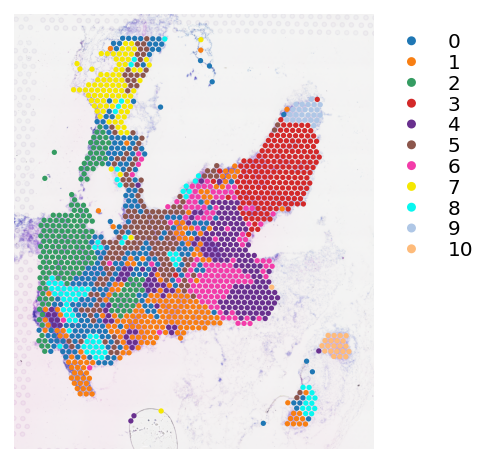

In [ ]:
st.em.run_pca(adata,n_comps=10,random_state=0)
st.pp.neighbors(adata,n_neighbors=15,use_rep='X_pca',random_state=0)
st.tl.clustering.louvain(adata,random_state=0)
st.pl.cluster_plot(adata,use_label="louvain",image_alpha=1,size=7)

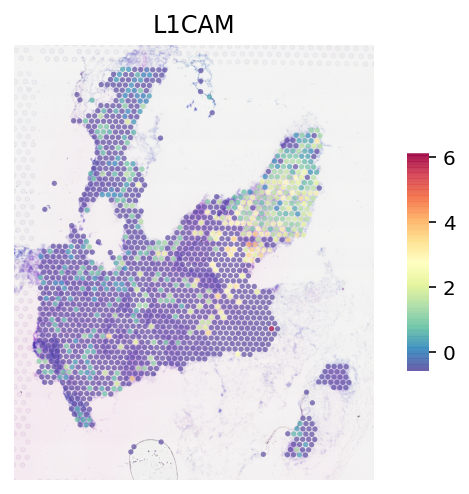

In [ ]:
st.pl.gene_plot(adata, gene_symbols="L1CAM")

In [ ]:
label = pd.read_csv('/content/drive/MyDrive/spatial/deconvolution_15a_result.csv', index_col=0)

In [ ]:
common_barcode  = list(set(adata.obs_names) & set(label.columns))

In [ ]:
label = label[common_barcode]
adata = adata[common_barcode,:]

In [ ]:
label = label[adata.obs_names]
adata.obsm["deconvolution"] = label[adata.obs.index].T

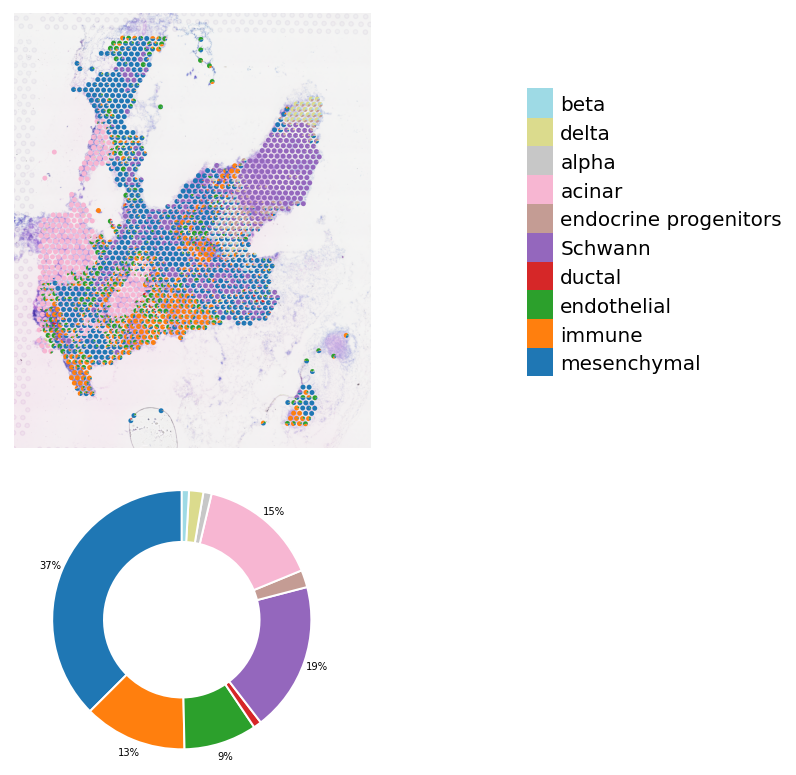

In [ ]:
st.pl.deconvolution_plot(adata,threshold=0.0)

In [ ]:
#Spatial trajectory of the Schwann cluster to endocrine

adata.uns["iroot"] = np.flatnonzero(adata.obs["louvain"]  == str(3))[50]
st.spatial.trajectory.pseudotime(adata,eps=50,use_rep="X_pca")

... storing 'feature_types' as categorical
... storing 'genome' as categorical


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 


/usr/local/lib/python3.7/dist-packages/stlearn/spatials/trajectory/pseudotime.py:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  v = np.array(list(dic.values()))
/usr/local/lib/python3.7/dist-packages/stlearn/spatials/trajectory/pseudotime.py:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  v = np.array(list(dic.values()))


Screening PTS global graph...


Screening: 100%|██████████ [ time left: 00:00 ]


Calculate the graph dissimilarity using Laplacian matrix...


Calculating: 100%|██████████ [ time left: 00:00 ]


The optimized weighting is: 0.5
Start to construct the trajectory: 3 -> 9


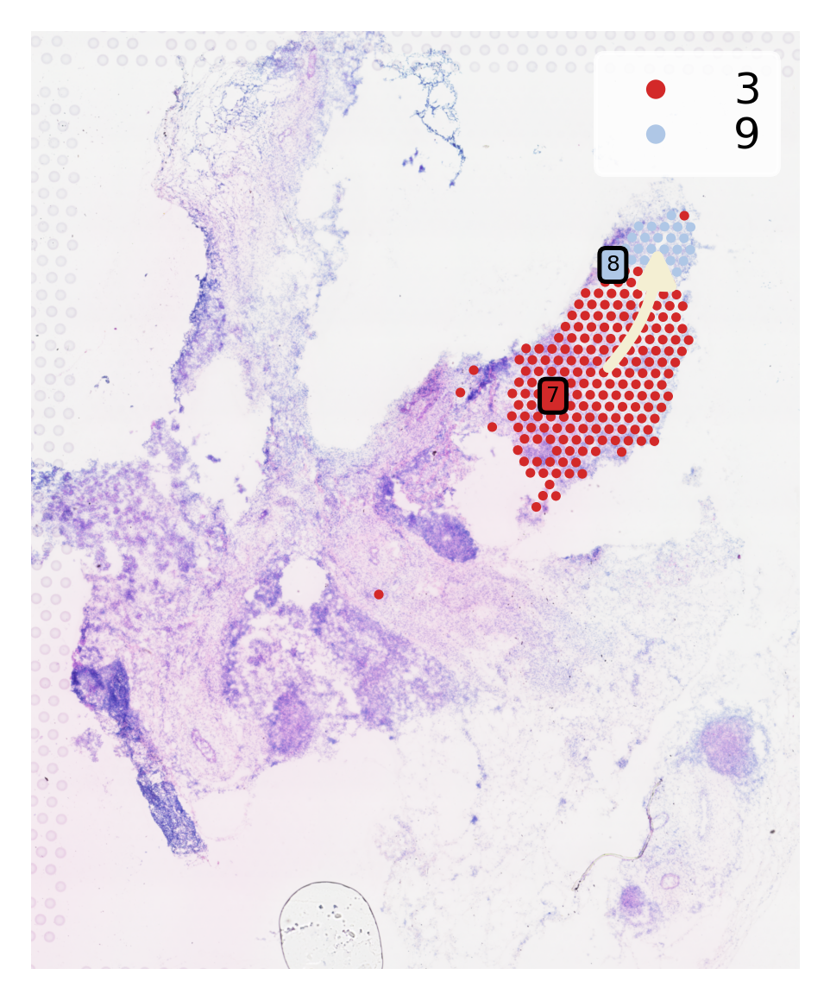

In [ ]:
st.spatial.trajectory.pseudotimespace_global(adata,use_label="louvain",list_clusters=[3,9])
st.pl.cluster_plot(adata,use_label="louvain",show_trajectories=True,list_clusters=[3,9],show_subcluster=True)

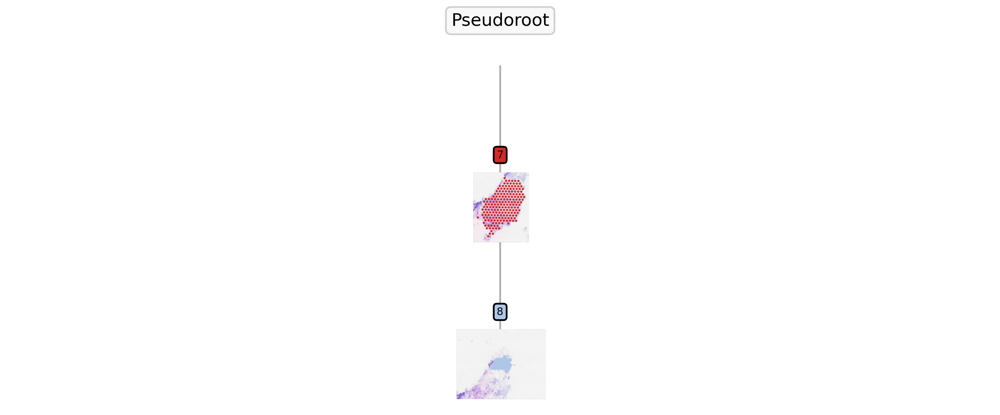

In [ ]:
st.pl.trajectory.tree_plot(adata)

In [ ]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=7,use_raw_count=False,cutoff_spearman=0.3)

Detecting the transition markers of clade_7...
Transition markers result is stored in adata.uns['clade_7']


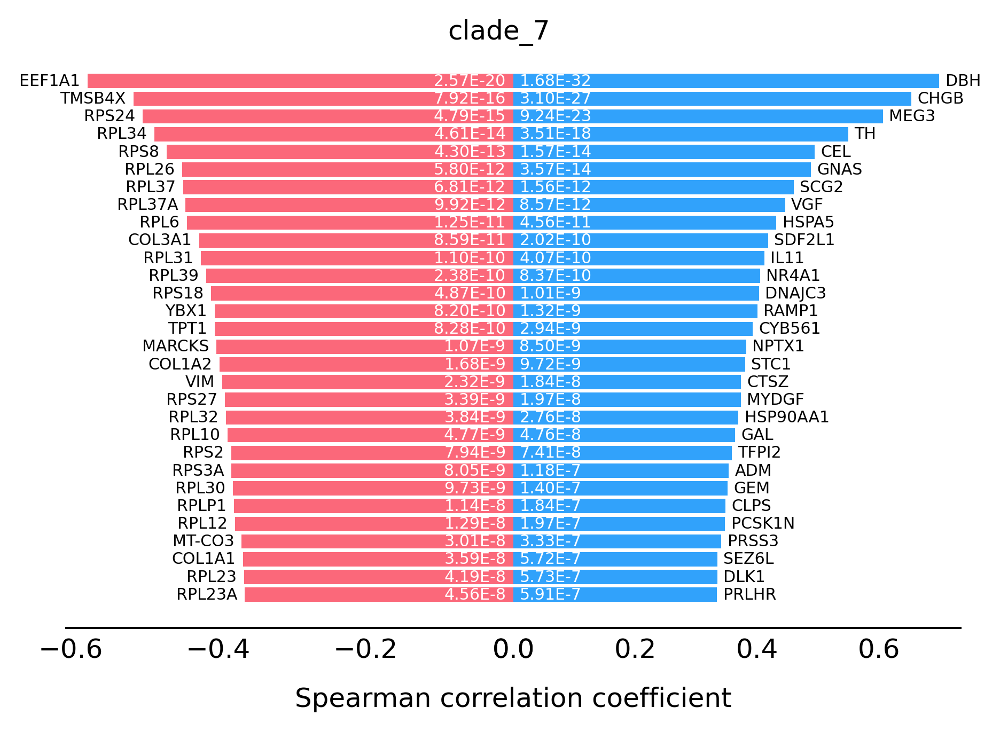

In [ ]:
st.pl.trajectory.transition_markers_plot(adata,top_genes=30,trajectory="clade_7")

PAGA plot:


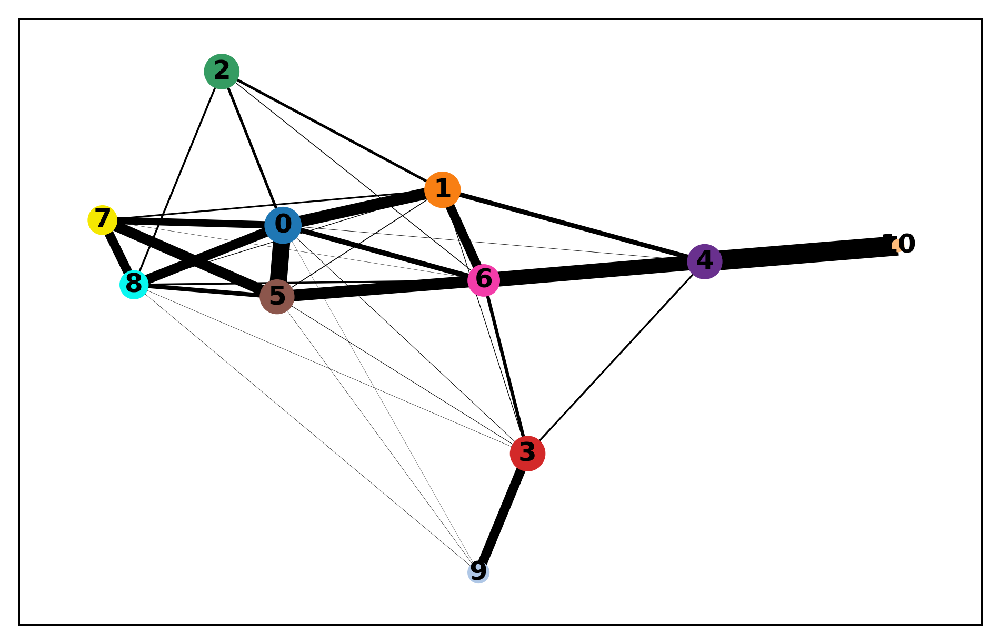

Gene expression (reduced dimension) plot:


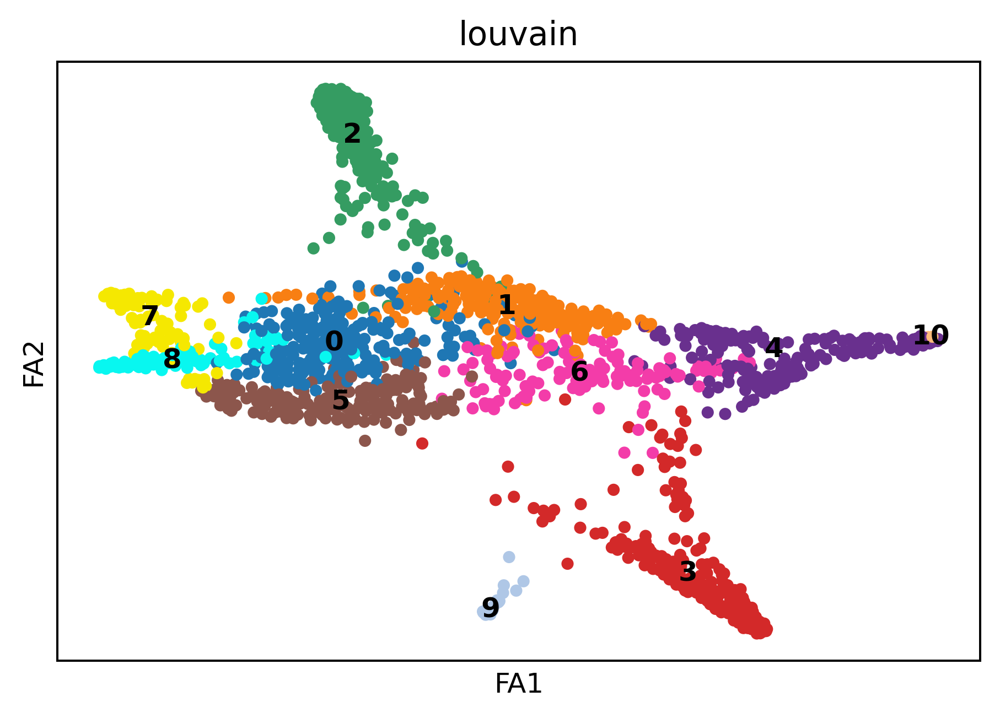

Diffusion pseudotime plot:


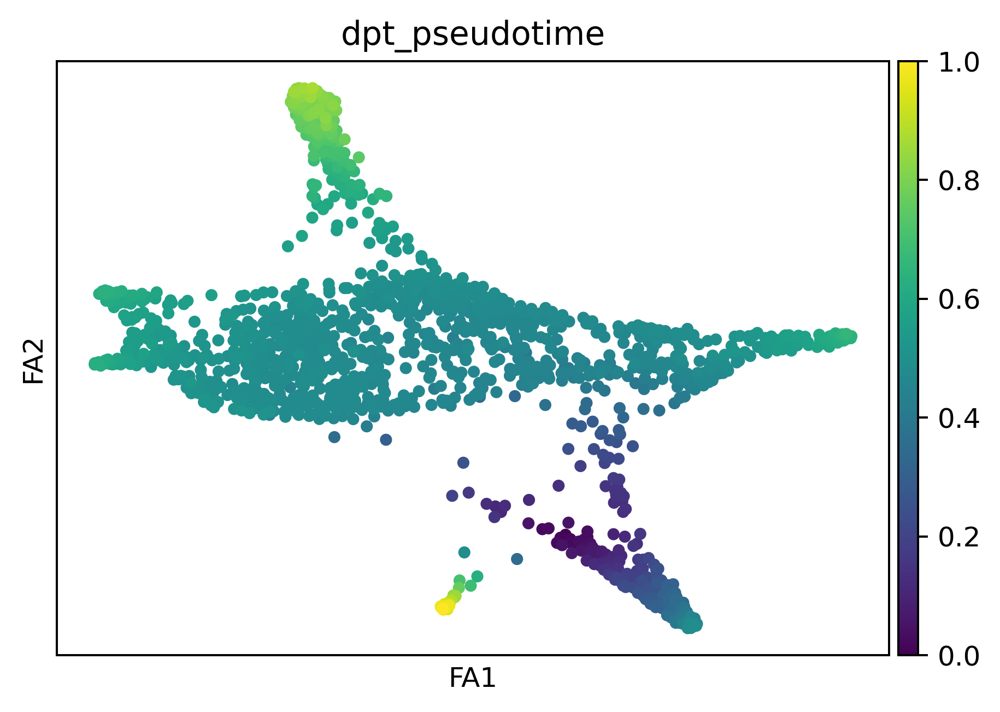

In [ ]:
st.settings.set_figure_params(dpi=180)
st.pl.non_spatial_plot(adata,use_label="louvain")

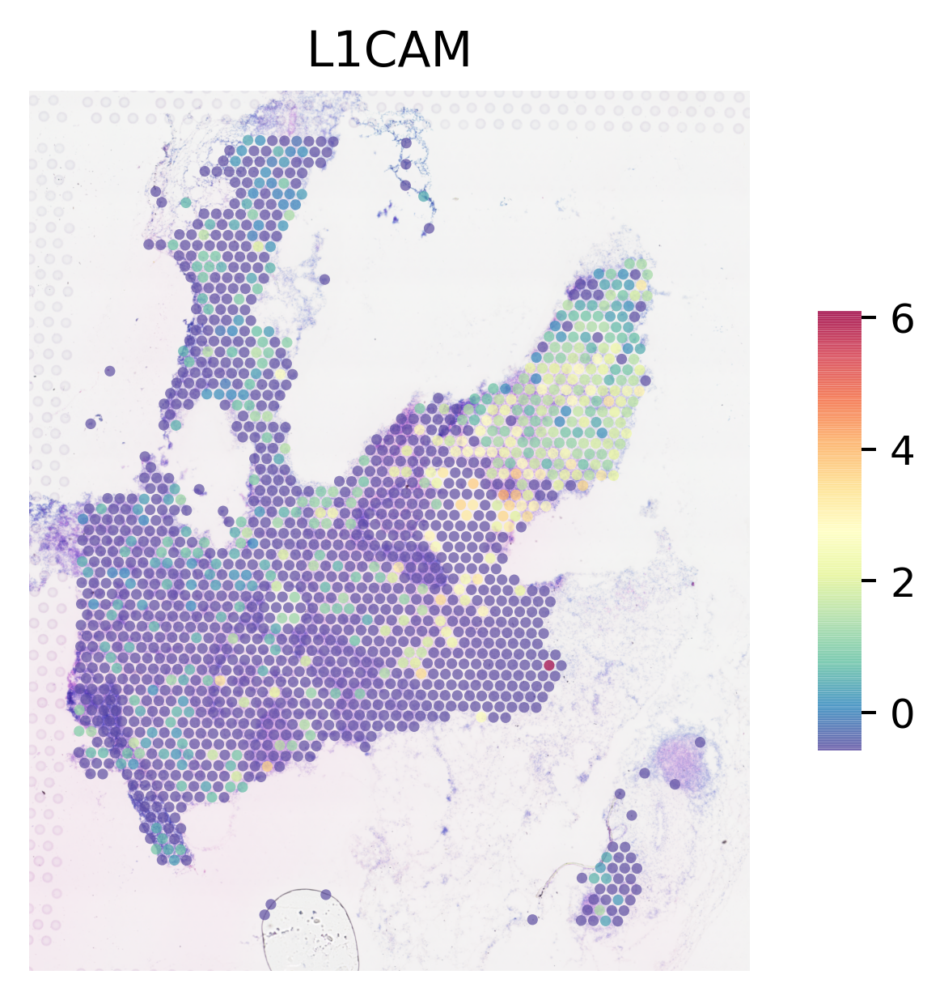

In [ ]:
st.settings.set_figure_params(dpi=180)
st.pl.gene_plot(adata, gene_symbols="L1CAM")

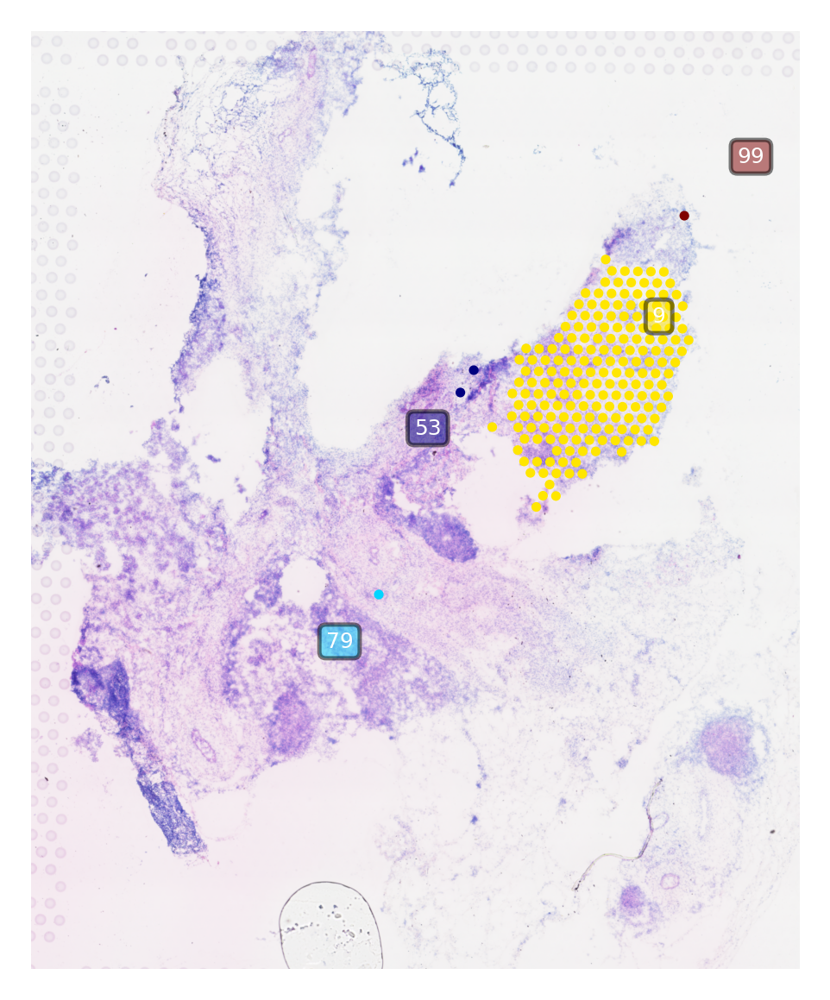

In [ ]:
st.pl.subcluster_plot(adata,use_label="louvain",cluster=3, image_alpha=1)

In [ ]:
##Ligand-receptor co-expression Schwann L1CAM and endocrine progenitor EPHB2
adata.uns["lr"] = ['L1CAM_EPHB2']

Altogether 2 valid L-R pairs
L-R interactions with neighbours are counted and stored into adata.obsm['cci_lr']


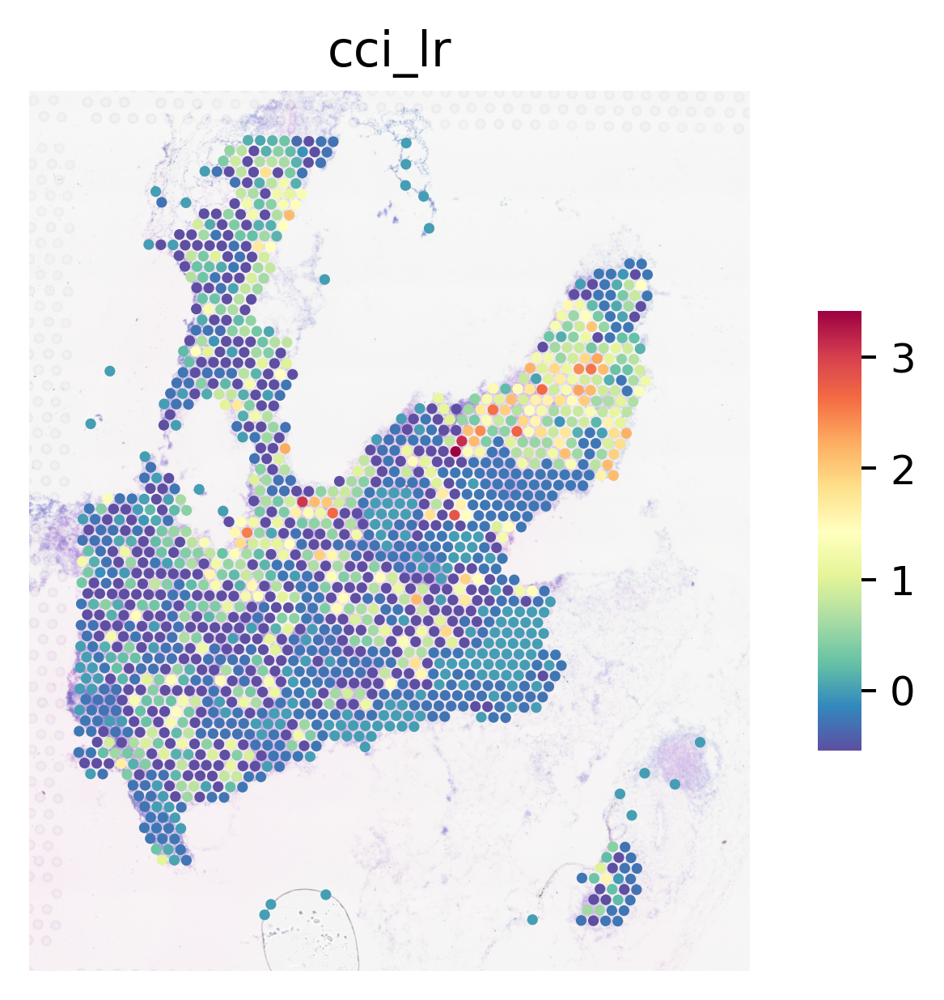

In [ ]:
st.tl.cci.lr(adata=adata)
st.pl.het_plot(adata, use_het='cci_lr', image_alpha=0.7)

Ligand-receptor co-expression within each spot

Altogether 2 valid L-R pairs
L-R interactions with neighbours are counted and stored into adata.obsm['cci_lr']


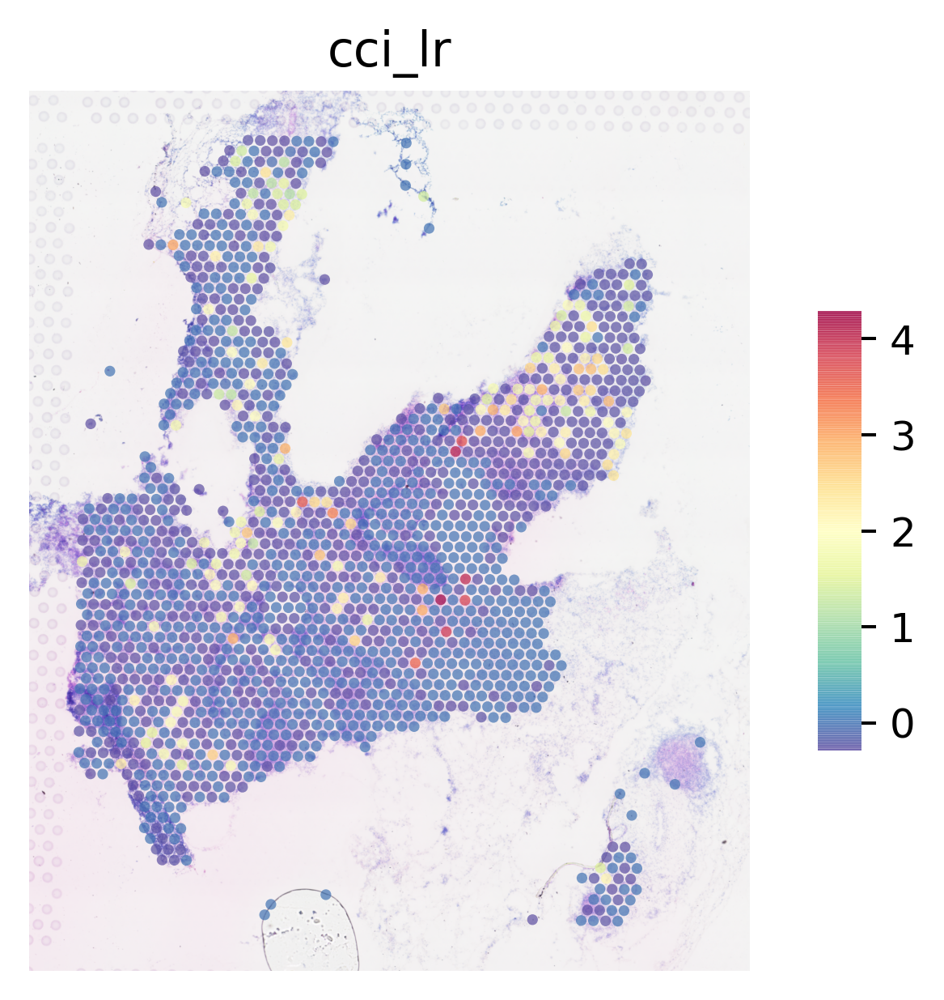

In [ ]:
st.tl.cci.lr(adata=adata, distance=0)
st.pl.het_plot(adata, use_het='cci_lr', cell_alpha=0.7)